<a href="https://colab.research.google.com/github/airctic/icevision/blob/master/notebooks/quickstart.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Quickstart
[EfficientDet: Scalable and Efficient Object Detection](https://arxiv.org/pdf/1911.09070.pdf)

![](https://github.com/ai-fast-track/icevision/blob/fridge-tutorial/images/fridge-objects.png?raw=1)

## Introduction

This tutorial walk you through the different steps of training the fridge dataset. the IceVision Framework is an **agnostic framework**. As an illustration, we will train our model using both the [fastai](https://github.com/fastai/fastai) library, and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning) libraries.

For more information about how the fridge dataset as well as its corresponding parser check out the [fridge folder](https://github.com/airctic/icedata/tree/master/icedata/datasets/fridge) in icedata.

## Installing IceVision and IceData

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# !pip install icevision[all] icedata

## Imports

In [3]:
from icevision.all import *

## Datasets : Fridge Objects dataset
Fridge Objects dataset is tiny dataset that contains 134 images of 4 classes:
- can, 
- carton, 
- milk bottle, 
- water bottle.

IceVision provides very handy methods such as loading a dataset, parsing annotations, and more. 

In [4]:
# Loading Data
url = "https://cvbp.blob.core.windows.net/public/datasets/object_detection/odFridgeObjects.zip"
dest_dir = "fridge"
data_dir = icedata.load_data(url, dest_dir)

In [5]:
# Parser
class_map = ClassMap(["milk_bottle", "carton", "can", "water_bottle"])
parser = parsers.voc(annotations_dir=data_dir / "odFridgeObjects/annotations",
                     images_dir=data_dir / "odFridgeObjects/images",
                     class_map=class_map)
# Records
train_records, valid_records = parser.parse()

  0%|          | 0/128 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:138


### Visualization
Showing a batch of images with their corresponding boxes and labels

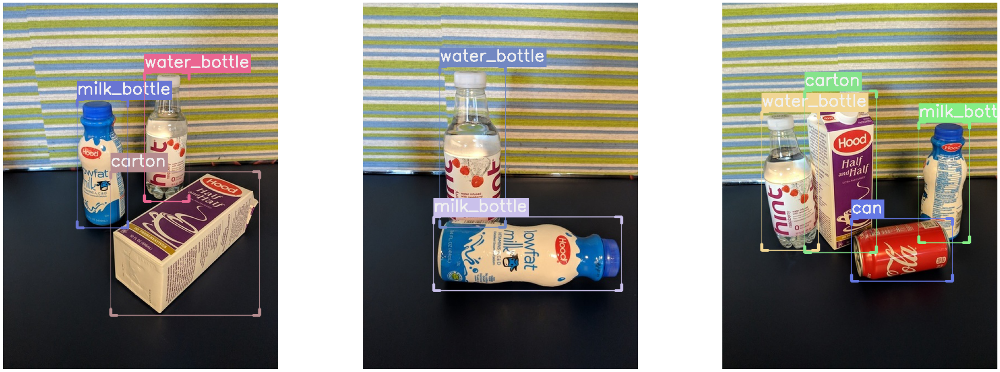

In [6]:
show_records(train_records[:3], ncols=3, class_map=class_map)

## Train and Validation Dataset Transforms

In [7]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=384, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(384), tfms.A.Normalize()])

In [8]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

### Displaying the same image with different transforms

Note:
> Transforms are applied **lazily**, meaning they are only applied when we grab (get) an item.
> This means that, if you have augmentation (random) transforms, each time you get the **same** item from 
> the dataset you will get a slightly different version of it.

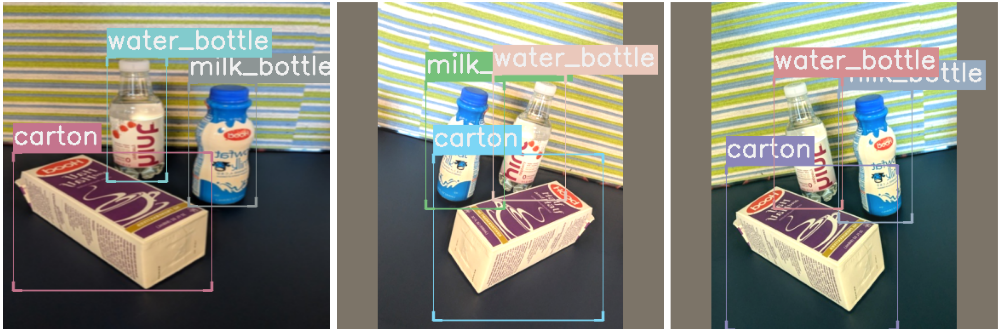

In [9]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [10]:
# DataLoaders
train_dl = efficientdet.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl = efficientdet.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)

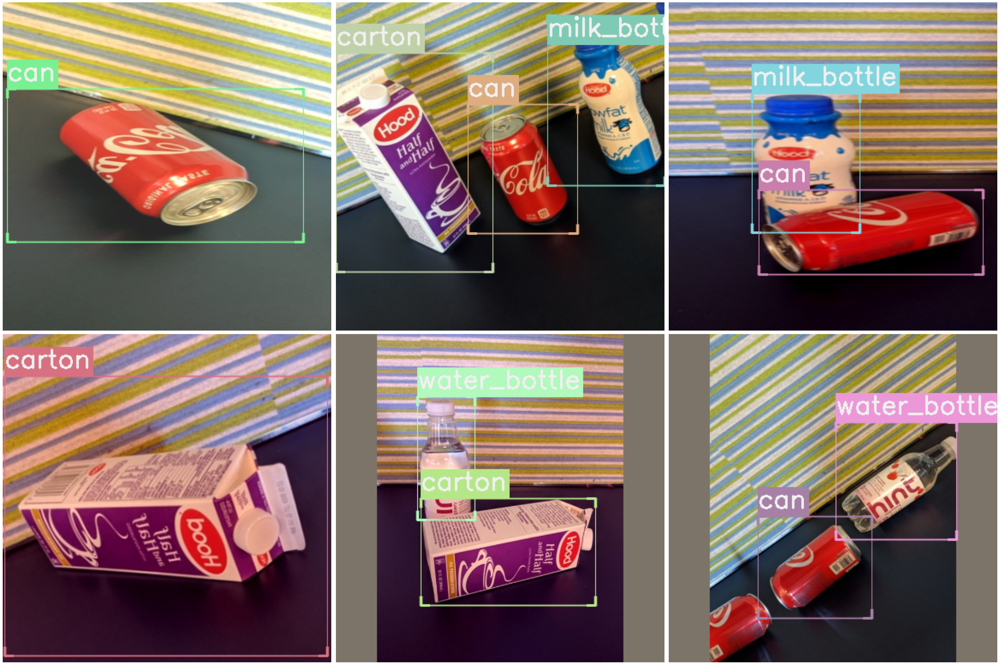

In [11]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model

In [12]:
model = efficientdet.model(model_name="tf_efficientdet_lite0", num_classes=len(class_map), img_size=384)

## Metrics

In [13]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

## Training

IceVision is an agnostic framework meaning it can be plugged to other DL framework such as [fastai2](https://github.com/fastai/fastai2), and [pytorch-lightning](https://github.com/PyTorchLightning/pytorch-lightning).  

You could also plug to oth DL framework using your own custom code.

### Training using fastai

In [14]:
learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

SuggestedLRs(lr_min=0.07585775852203369, lr_steep=0.6309573650360107)

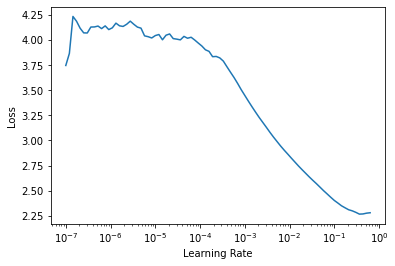

In [14]:
learn.freeze()
learn.lr_find()

In [14]:
learn.fine_tune(20, 1e-2, freeze_epochs=2)

epoch,train_loss,valid_loss,COCOMetric,time
0,3.248568,1.303852,0.003783,00:09
1,2.256635,1.442330,0.000478,00:05


epoch,train_loss,valid_loss,COCOMetric,time
0,1.225006,1.184424,0.055458,00:07
1,1.135946,1.034212,0.157824,00:06
2,1.053997,0.934719,0.231800,00:06
3,0.970122,0.859426,0.202538,00:06
4,0.894300,0.746884,0.259649,00:06
5,0.831597,0.776996,0.262668,00:06
6,0.778615,0.784060,0.321958,00:06
7,0.727321,0.685941,0.426012,00:06
8,0.683595,0.632713,0.489964,00:06
9,0.644443,0.618587,0.515480,00:06


In [15]:
learn.load('fridge')

In [16]:
learn.save('fridge')

Path('models/fridge.pth')

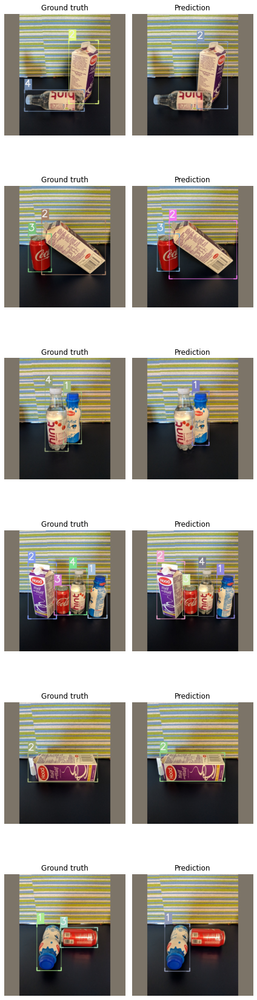

In [17]:
efficientdet.show_results(model, valid_ds)

### Training using Lightning

In [18]:
class LightModel(efficientdet.lightning.ModelAdapter):
    def configure_optimizers(self):
        return SGD(self.parameters(), lr=1e-2)
    
light_model = LightModel(model, metrics=metrics)

In [2]:
trainer = pl.Trainer(max_epochs=50, gpus=1)
trainer.fit(light_model, train_dl, valid_dl)

## Inference

### Predicting a batch of images

Instead of predicting a whole list of images at one, we can process small batch at the time: This option is more memory efficient. 


In [18]:
infer_dl = efficientdet.infer_dl(valid_ds, batch_size=8)
preds = efficientdet.predict_dl(model, infer_dl)

  0%|          | 0/4 [00:00<?, ?it/s]

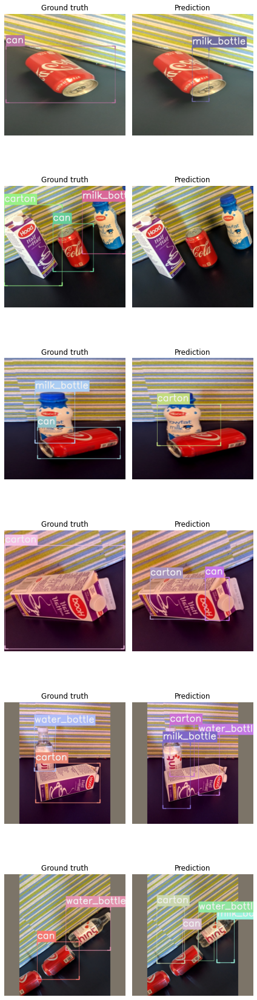

In [19]:
show_preds(
    samples=samples[:6],
    preds=preds[:6],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=3,
)

## Saving Model on Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

In [ ]:
torch.save(model.state_dict(), root_dir/'icevision/models/fridge/fridge_tf_efficientdet_lite0.pth')

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).